In [1]:
import tensorflow as tf
from tensorflow.keras import layers, Model
import matplotlib.pyplot as plt
import numpy as np

In [2]:
# --- Keep your ResidualBlock the same ---
class ResidualBlock(layers.Layer):
    def __init__(self, filters):
        super(ResidualBlock, self).__init__()
        self.conv1 = layers.Conv2D(filters, kernel_size=3, padding='same', use_bias=False, kernel_initializer='he_normal')
        self.bn1 = layers.BatchNormalization()
        self.activation = layers.Activation('relu')
        self.se    = tf.keras.Sequential([
                       layers.GlobalAveragePooling2D(),
                       layers.Dense(filters//4, activation='relu'),
                       layers.Dense(filters, activation='sigmoid'),
                       layers.Reshape((1,1,filters))
                     ])

    def call(self, x, training=False):
        residual = x
        y = self.activation(self.bn1(self.conv1(x), training=training))
        y = y*self.se(y,training=training)
        y += residual
        return y

# --- VQVAE with TWO-HEADED Quantization and Codebook Resetting ---
class VQVAE(tf.keras.Model):
    def __init__(self, num_embeddings=1024, embedding_dim=256):
        super(VQVAE, self).__init__()
        self.num_embeddings = num_embeddings
        self.embedding_dim = embedding_dim
        
        # The latent space is split, so each codebook handles half the dimension
        self.d_head = embedding_dim // 2 
        
        if embedding_dim % 2 != 0:
            raise ValueError("embedding_dim must be an even number for the two-head split.")

        # --- Encoder remains the same ---
        self.encoder = tf.keras.Sequential([
            layers.Conv2D(self.embedding_dim//16, kernel_size=2, strides=2, padding='same', use_bias=False, kernel_initializer='he_normal', input_shape=(224,224,3)),
            layers.BatchNormalization(), 
            layers.Activation('relu'), 
            ResidualBlock(self.embedding_dim//16),

            layers.Conv2D(self.embedding_dim//8, kernel_size=2, strides=2, padding='same', use_bias=False, kernel_initializer='he_normal'),
            layers.BatchNormalization(), 
            layers.Activation('relu'), 
            ResidualBlock(self.embedding_dim//8),

            layers.Conv2D(self.embedding_dim//4, kernel_size=2, strides=2, padding='same', use_bias=False, kernel_initializer='he_normal'),
            layers.BatchNormalization(), 
            layers.Activation('relu'), 
            ResidualBlock(self.embedding_dim//4),

            layers.Conv2D(self.embedding_dim//2, kernel_size=2, strides=2, padding='same', use_bias=False, kernel_initializer='he_normal'),
            layers.BatchNormalization(), 
            layers.Activation('relu'), 
            ResidualBlock(self.embedding_dim//2),

            layers.Conv2D(self.embedding_dim, kernel_size=3, padding='same', use_bias=True),
        ])

        # --- Two Embedding Layers and Two Usage Trackers ---
        H,W = 14,14
        self.emb1 = layers.Embedding(self.num_embeddings, self.d_head)
        self.emb2 = layers.Embedding(self.num_embeddings, self.d_head)
        self.emb1.build((None, H*W))
        self.emb2.build((None, H*W))
 
        # We use a non-trainable variable to track code usage for EACH codebook.
        self.codebook1_usage = tf.Variable(tf.zeros(self.num_embeddings), trainable=False, name='codebook1_usage')
        self.codebook2_usage = tf.Variable(tf.zeros(self.num_embeddings), trainable=False, name='codebook2_usage')

        # --- Decoder remains the same ---
        self.decoder = tf.keras.Sequential([
            layers.Conv2DTranspose(self.embedding_dim, kernel_size=2, strides=2, padding='same', use_bias=False, kernel_initializer='he_normal', input_shape=(14,14,self.embedding_dim)),
            layers.BatchNormalization(), 
            layers.Activation('relu'), 
            ResidualBlock(self.embedding_dim),

            layers.Conv2DTranspose(self.embedding_dim//2, kernel_size=2, strides=2, padding='same', use_bias=False, kernel_initializer='he_normal'),
            layers.BatchNormalization(), 
            layers.Activation('relu'), 
            ResidualBlock(self.embedding_dim//2),

            layers.Conv2DTranspose(self.embedding_dim//4, kernel_size=2, strides=2, padding='same', use_bias=False, kernel_initializer='he_normal'),
            layers.BatchNormalization(), 
            layers.Activation('relu'), 
            ResidualBlock(self.embedding_dim//4),

            layers.Conv2DTranspose(self.embedding_dim//8, kernel_size=2, strides=2, padding='same', use_bias=False, kernel_initializer='he_normal'),
            layers.BatchNormalization(), 
            layers.Activation('relu'),
            ResidualBlock(self.embedding_dim//8),

            layers.Conv2D(self.embedding_dim//16, kernel_size=3, padding='same', use_bias=False, kernel_initializer='he_normal'),
            layers.BatchNormalization(), 
            layers.Activation('relu'),
            ResidualBlock(self.embedding_dim//16),

            layers.Conv2D(3, kernel_size=3, padding='same', use_bias=True, activation='sigmoid')
        ])

    def _vector_quantise(self, z_split, emb):
        """Helper function to quantize a single split latent vector."""
        e = emb.weights[0]
        dist = (tf.reduce_sum(z_split**2, 1, keepdims=True)
                - 2 * tf.matmul(z_split, e, transpose_b=True)
                + tf.reduce_sum(e**2, 1))
        k = tf.argmin(dist, axis=1)
        e_q = tf.gather(e, k)
        return e_q, k

    def call(self, x, training=False):
        z = self.encoder(x, training=training)
        B, H, W, C = tf.unstack(tf.shape(z))
        
        # Split the latent space into two heads
        z1, z2 = tf.split(z, 2, axis=-1)
        z1_flat = tf.reshape(z1, [-1, self.d_head])
        z2_flat = tf.reshape(z2, [-1, self.d_head])

        # Quantize each head separately
        e1_q, k1 = self._vector_quantise(z1_flat, self.emb1)
        e2_q, k2 = self._vector_quantise(z2_flat, self.emb2)
        
        # Update usage statistics for both codebooks during training
        if training:
            decay = 0.99         
            
            # --- Update Codebook 1 Usage ---
            self.codebook1_usage.assign(self.codebook1_usage * decay)
            k1_one_hot = tf.one_hot(k1, self.num_embeddings)
            usage_in_batch1 = tf.reduce_sum(k1_one_hot, axis=0)
            self.codebook1_usage.assign_add(usage_in_batch1)
            
            # --- Update Codebook 2 Usage ---
            self.codebook2_usage.assign(self.codebook2_usage * decay)
            k2_one_hot = tf.one_hot(k2, self.num_embeddings)
            usage_in_batch2 = tf.reduce_sum(k2_one_hot, axis=0)
            self.codebook2_usage.assign_add(usage_in_batch2)

        # Total commitment loss is the sum from both heads
        commitment_loss = (tf.reduce_mean(tf.square(z1_flat - tf.stop_gradient(e1_q))) +
                           tf.reduce_mean(tf.square(z2_flat - tf.stop_gradient(e2_q))))
        
        # Total codebook loss is the sum from both heads
        codebook_loss = (tf.reduce_mean(tf.square(tf.stop_gradient(z1_flat) - e1_q)) +
                         tf.reduce_mean(tf.square(tf.stop_gradient(z2_flat) - e2_q)))

        # Re-combine the quantized vectors for the Straight-Through Estimator
        e_q_flat = tf.concat([e1_q, e2_q], axis=-1)
        z_flat = tf.concat([z1_flat, z2_flat], axis=-1)

        # Apply Straight-Through Estimator and reshape for decoder
        z_q = tf.reshape(z_flat + tf.stop_gradient(e_q_flat - z_flat), [B, H, W, C])
        
        x_hat = self.decoder(z_q, training=training)

        # Return split latents for resetting
        return x_hat, commitment_loss, codebook_loss, (z1_flat, z2_flat)
    
    def _reset_one_codebook(self, codebook_usage, embedding_layer, z_batch_flat, codebook_id_str):
        """Helper to reset dead codes for a single codebook."""
        dead_indices = tf.where(codebook_usage < 1.0)
        num_dead = tf.shape(dead_indices)[0]

        if num_dead == 0:
            return

        num_replacements = tf.shape(z_batch_flat)[0]
        random_indices = tf.random.uniform(shape=[num_dead], maxval=num_replacements, dtype=tf.int32)
        replacements = tf.gather(z_batch_flat, random_indices)

        current_codebook = embedding_layer.weights[0]
        updated_codebook = tf.tensor_scatter_nd_update(current_codebook, dead_indices, replacements)
        embedding_layer.set_weights([updated_codebook])
        
        reset_usage_values = tf.ones(num_dead, dtype=tf.float32)
        updated_usage = tf.tensor_scatter_nd_update(codebook_usage, dead_indices, reset_usage_values)
        codebook_usage.assign(updated_usage)

        tf.print("Codebook", codebook_id_str, ": Reset", num_dead, "dead codes.")

    def reset_dead_codes(self, z_batches_flat):
        """
        Resets dead codes for both codebooks using random encoder outputs
        from the current batch. Expects a tuple of (z1_flat, z2_flat).
        """
        z1_batch_flat, z2_batch_flat = z_batches_flat
        self._reset_one_codebook(self.codebook1_usage, self.emb1, z1_batch_flat, "1")
        self._reset_one_codebook(self.codebook2_usage, self.emb2, z2_batch_flat, "2")
        return None
    
    def get_embedding(self, x, training=False):
        """
        Encodes an image and returns interleaved sequences of quantized embeddings
        and their corresponding unified codebook indices.

        Args:
            x (tf.Tensor): The input image tensor.
            training (bool): Flag for training mode.

        Returns:
            tuple: A tuple containing:
                - interleaved_embeddings (tf.Tensor): Interleaved quantized embeddings.
                  Shape: (B, H * W * 2, self.d_head).
                - interleaved_indices (tf.Tensor): Interleaved and unified codebook indices.
                  The indices from the second codebook are offset by `num_embeddings`.
                  Shape: (B, H * W * 2).
                  Value Range: [0, 2 * num_embeddings - 1].
        """
        # --- 1. Encode and get dimensions ---
        z = self.encoder(x, training=training)
        B, H, W, C = tf.unstack(tf.shape(z))
        
        # --- 2. Split and Quantize ---
        z1, z2 = tf.split(z, 2, axis=-1)
        z1_flat = tf.reshape(z1, [-1, self.d_head])
        z2_flat = tf.reshape(z2, [-1, self.d_head])

        e1_q, k1 = self._vector_quantise(z1_flat, self.emb1) # k1 range: [0, 1023]
        e2_q, k2 = self._vector_quantise(z2_flat, self.emb2) # k2 range: [0, 1023]

        # --- THE CRUCIAL CHANGE: Offset the indices from the second codebook ---
        k2_shifted = k2 + self.num_embeddings # k2_shifted range: [1024, 2047]

        # --- 3. Interleave the Continuous Embeddings (No changes here) ---
        e1_q_batched = tf.reshape(e1_q, [B, H * W, self.d_head])
        e2_q_batched = tf.reshape(e2_q, [B, H * W, self.d_head])
        stacked_embeddings = tf.stack([e1_q_batched, e2_q_batched], axis=2)
        interleaved_embeddings = tf.reshape(stacked_embeddings, [B, -1, self.d_head])
        
        # --- 4. Interleave the Discrete Indices (using the shifted k2) ---
        k1_batched = tf.reshape(k1, [B, H * W])
        k2_batched_shifted = tf.reshape(k2_shifted, [B, H * W]) # Use the shifted indices
        
        stacked_indices = tf.stack([k1_batched, k2_batched_shifted], axis=2)
        interleaved_indices = tf.reshape(stacked_indices, [B, -1])

        return interleaved_embeddings, interleaved_indices
    
    def decode_indices(self, indices):
        """
        Takes a sequence of unified indices and returns the corresponding quantized
        embedding vectors. This is the reverse of get_embedding.

        Args:
            indices (tf.Tensor): A tensor of integer indices with shape (B, Seq_Len),
                                 where Seq_Len is H*W*2. Values are in the range
                                 [0, 2 * num_embeddings - 1].

        Returns:
            tf.Tensor: The corresponding sequence of quantized embeddings.
                       Shape: (B, Seq_Len, self.d_head).
        """
        # Identify which codebook each index belongs to
        # is_from_emb2 will be a boolean tensor of the same shape as indices
        is_from_emb2 = indices >= self.num_embeddings

        # Get the original index for codebook 2 by subtracting the offset
        # Use tf.where to apply the subtraction only where needed
        original_indices = tf.where(is_from_emb2, indices - self.num_embeddings, indices)
        
        # Get the embedding vectors from each codebook
        emb1_vectors = self.emb1(original_indices) # Shape: (B, Seq_Len, d_head)
        emb2_vectors = self.emb2(original_indices) # Shape: (B, Seq_Len, d_head)
        
        # Select the correct vector for each position
        # If is_from_emb2 is True, take from emb2_vectors, otherwise from emb1_vectors
        decoded_embeddings = tf.where(tf.expand_dims(is_from_emb2, -1), emb2_vectors, emb1_vectors)
        
        return decoded_embeddings

# Instantiate the model
model = VQVAE()
model.summary()

/Users/saptarshimallikthakur/Desktop/Extraas/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2025-06-27 23:43:07.830543: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2
2025-06-27 23:43:07.830569: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 24.00 GB
2025-06-27 23:43:07.830572: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 8.00 GB
I0000 00:00:1751047987.830583 27610566 pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
I0000 00:00:1751047987.830602 27610566 pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/t

Model: "vqvae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_4 (Sequential)       │ (None, 14, 14, 256)    │       547,308 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding (Embedding)           │ (None, 196, 128)       │       131,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding_1 (Embedding)         │ (None, 196, 128)       │       131,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_10 (Sequential)      │ (None, 224, 224, 3)    │     1,273,119 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,082,571 (7.94 MB)

 Trainable params: 2,079,627 (7.93 MB)

 Non-trainable params: 2,944 (11.50 KB)

In [3]:
import pandas as pd
import json

df1 = pd.read_csv('/Users/saptarshimallikthakur/Desktop/Extraas/Towards VLM/VLM/GQA/sampled_gqa_data.csv')[['imageId']]
df2 = pd.read_csv('/Users/saptarshimallikthakur/Desktop/Extraas/Towards VLM/VLM/GQA/sampled_gqa_data2.csv')[['imageId']]
df = pd.concat([df1,df2]).reset_index(drop=True)
df['imageId'] = df['imageId'].apply(lambda x: '/Users/saptarshimallikthakur/Desktop/Extraas/Towards VLM/VLM/GQA/resized_images/'+str(x)+'.jpg')
df = df.rename(columns={'imageId':'img_path'}).drop_duplicates(subset='img_path')


with open('/Users/saptarshimallikthakur/Desktop/Extraas/Towards VLM/VLM/fsvqa/fsvqa_original/fsvqa_original_train_questions.json', 'r') as f:
    data = json.load(f)

# 'questions' is expected to be a list of dictionaries
questions = data['questions']

# Convert list of dicts to DataFrame
df1 = pd.DataFrame(questions)[['img_id']]
df1['img_id'] = df1['img_id'].apply(lambda x: '/Users/saptarshimallikthakur/Desktop/Extraas/Towards VLM/VLM/fsvqa/train2014/'+str(x)+'.jpg')
df1 = df1.rename(columns={'img_id':'img_path'})
df1 = df1.drop_duplicates(subset='img_path')

df = pd.concat([df1,df]).reset_index(drop=True)
df = df.iloc[:int(0.3*len(df))]
df

,img_path
0,/Users/saptarshimallikthakur/Desktop/Extraas/T...
1,/Users/saptarshimallikthakur/Desktop/Extraas/T...
2,/Users/saptarshimallikthakur/Desktop/Extraas/T...
3,/Users/saptarshimallikthakur/Desktop/Extraas/T...
4,/Users/saptarshimallikthakur/Desktop/Extraas/T...
...,...
50395,/Users/saptarshimallikthakur/Desktop/Extraas/T...
50396,/Users/saptarshimallikthakur/Desktop/Extraas/T...
50397,/Users/saptarshimallikthakur/Desktop/Extraas/T...
50398,/Users/saptarshimallikthakur/Desktop/Extraas/T...


In [4]:
import tensorflow as tf
from sklearn.model_selection import train_test_split

# 1. Split your DataFrame into train / val
train_df, val_df = train_test_split(df, test_size=0.01, random_state=42)

# 2. A helper to load & preprocess one image
def load_and_preprocess(path):
    # read the file
    img = tf.io.read_file(path)
    # decode JPEG/PNG into [H,W,3] uint8
    img = tf.image.decode_image(img, channels=3, expand_animations=False)
    # cast to float32 & resize
    img = tf.image.resize(img, [224, 224])
    img = tf.cast(img, tf.float32) / 255.0
    # for an auto-encoder, inputs = targets
    return img, img

# 3. Create tf.data pipelines
def make_dataset(paths, batch_size=32, shuffle=True):
    ds = tf.data.Dataset.from_tensor_slices(paths)
    if shuffle:
        ds = ds.shuffle(buffer_size=len(paths))
    ds = ds.map(load_and_preprocess,num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(batch_size)
    ds = ds.prefetch(tf.data.AUTOTUNE)
    return ds

train_ds = make_dataset(train_df["img_path"].values, batch_size=32, shuffle=True)
val_ds   = make_dataset(val_df["img_path"].values,   batch_size=32, shuffle=False)

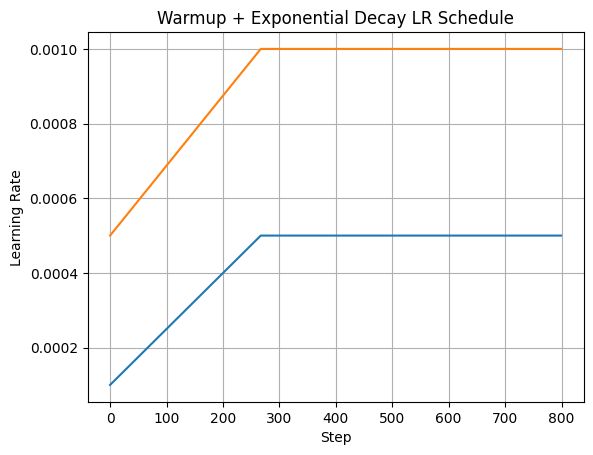

In [5]:
class WarmupThenExponentialDecay(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, total_steps, warmup_steps, base_lr, max_lr, min_lr):
        super().__init__()
        self.total_steps = total_steps
        self.warmup_steps = warmup_steps
        self.base_lr = base_lr
        self.max_lr = max_lr
        self.min_lr = min_lr
        self.decay_steps = total_steps - self.warmup_steps
        self.decay_rate = self.max_lr/self.min_lr

    def __call__(self, step):
        step = tf.cast(step, tf.float32)

        # Warmup (linear increase)
        warmup_lr = self.base_lr + (self.max_lr - self.base_lr) * (step / self.warmup_steps)

        # Exponential decay (controlled by decay_rate)
        decay_step = step - self.warmup_steps
        decay_rate_tf = tf.constant(self.decay_rate, dtype=tf.float32)
        decay_lr = self.max_lr * tf.pow(decay_rate_tf, -decay_step / self.decay_steps)
        decay_lr = tf.maximum(decay_lr, self.min_lr)

        return tf.where(step < self.warmup_steps,  warmup_lr, decay_lr)
    
lr_schedule1 = WarmupThenExponentialDecay(
    total_steps=800,
    warmup_steps=267,
    base_lr=1e-4,
    max_lr=5e-4,
    min_lr=5e-4
)

lr_schedule2 = WarmupThenExponentialDecay(
    total_steps=800,
    warmup_steps=267,
    base_lr=5e-4,
    max_lr=1e-3,
    min_lr=1e-3
)

lrs1 = [lr_schedule1(step).numpy() for step in range(800)]
lrs2 = [lr_schedule2(step).numpy() for step in range(800)]
plt.plot(lrs1)
plt.plot(lrs2)
plt.title("Warmup + Exponential Decay LR Schedule")
plt.xlabel("Step")
plt.ylabel("Learning Rate")
plt.grid(True)
plt.show()

In [6]:
# Constants
BATCH_SIZE     = 32
STEPS_PER_EPOCH = len(train_df) // BATCH_SIZE
EPOCHS   = 5
TOTAL_STEPS    = STEPS_PER_EPOCH * EPOCHS 
print(TOTAL_STEPS)

# Instantiate and hand it to Adam:
lr_schedule_main = WarmupThenExponentialDecay(
    total_steps=TOTAL_STEPS,
    warmup_steps=STEPS_PER_EPOCH,
    base_lr=1e-4,
    max_lr=5e-4,
    min_lr=5e-4
)

lr_schedule_embed = WarmupThenExponentialDecay(
    total_steps=TOTAL_STEPS,
    warmup_steps=STEPS_PER_EPOCH,
    base_lr=5e-4,
    max_lr=1e-3,
    min_lr=1e-3
)

optimizer_main = tf.keras.optimizers.Adam(learning_rate=lr_schedule_main)
optimizer_embed = tf.keras.optimizers.Adam(learning_rate=lr_schedule_embed)

7795


In [7]:
from tensorflow.keras.applications import VGG19

IMG_SHAPE = (224, 224, 3)

# Pre-trained ImageNet weights give the perceptual signal its “visual prior”.
base = VGG19(
    input_shape=IMG_SHAPE,
    include_top=False,
    weights=None,  
    pooling=None
)

base.load_weights("/Users/saptarshimallikthakur/Desktop/Extraas/Text2IMG/Dall-E/VQVAE/vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5")
base.trainable = False   # freeze

# feat_extractor = tf.keras.Model(
#     inputs=base.input,
#     outputs=base.get_layer("block2_conv2").output,
#     name="vgg19_fe"
# )

# @tf.function
# def perceptual_loss(x, x_rec, weight=1e-5):
#     """
#     Computes perceptual loss between x and x_rec using VGG19 block2_conv2 features.
#     Inputs x and x_rec are tensors in range [0, 1].
#     """
#     # Convert to [0, 255] and apply VGG preprocessing (BGR, mean subtraction)
#     x_vgg      = tf.keras.applications.vgg19.preprocess_input(x * 255.0)
#     x_rec_vgg  = tf.keras.applications.vgg19.preprocess_input(x_rec * 255.0)

#     # Extract feature maps
#     feat_x     = feat_extractor(x_vgg, training=False)
#     feat_rec   = feat_extractor(x_rec_vgg, training=False)

#     # Compute MSE between feature maps
#     loss = tf.reduce_mean(tf.square(feat_x - feat_rec))
#     return weight * loss


# Pick a handful of hierarchical feature maps.
_feat_layers_detail = ["block1_conv2","block2_conv2"]

# One model → list[Tensor] output
feat_extractor_detail = tf.keras.Model(
    inputs=base.input,
    outputs=[base.get_layer(name).output for name in _feat_layers_detail],
    name="vgg19_fe"
)

@tf.function
def perceptual_loss_detail(x, x_rec, weight=1e-5):
    """x, x_rec in range [0,1]; returns scalar loss."""
    # (a) undo your earlier /255 normalisation
    x_255      = x      * 255.0
    x_rec_255  = x_rec  * 255.0

    x_255 = tf.keras.applications.vgg19.preprocess_input(x_255)
    x_rec_255 = tf.keras.applications.vgg19.preprocess_input(x_rec_255)

    # (b) run through frozen network
    feats_x      = feat_extractor_detail(x_255,     training=False)
    feats_x_rec  = feat_extractor_detail(x_rec_255, training=False)

    weights = [1,1]             
    p_raw   = tf.add_n([w * tf.reduce_mean(tf.square(a-b)) for w, (a, b) in zip(weights, zip(feats_x, feats_x_rec))])
    p_loss  = p_raw/sum(weights)
    return weight * p_loss  


# Pick a handful of hierarchical feature maps.
_feat_layers_outline = ["block3_conv3","block4_conv3"]

# One model → list[Tensor] output
feat_extractor_outline = tf.keras.Model(
    inputs=base.input,
    outputs=[base.get_layer(name).output for name in _feat_layers_outline],
    name="vgg19_fe"
)

@tf.function
def perceptual_loss_outline(x, x_rec, weight=1e-5):
    """x, x_rec in range [0,1]; returns scalar loss."""
    # (a) undo your earlier /255 normalisation
    x_255      = x      * 255.0
    x_rec_255  = x_rec  * 255.0

    x_255 = tf.keras.applications.vgg19.preprocess_input(x_255)
    x_rec_255 = tf.keras.applications.vgg19.preprocess_input(x_rec_255)

    # (b) run through frozen network
    feats_x      = feat_extractor_outline(x_255,     training=False)
    feats_x_rec  = feat_extractor_outline(x_rec_255, training=False)

    weights = [1,1]             
    p_raw   = tf.add_n([w * tf.reduce_mean(tf.square(a-b)) for w, (a, b) in zip(weights, zip(feats_x, feats_x_rec))])
    p_loss  = p_raw/sum(weights)
    return weight * p_loss  

BETA_WARMUP_STEPS = STEPS_PER_EPOCH * EPOCHS*4 

i did the above to let encoder give a more free run!

In [ ]:
# --- Metrics and Loss Function (remain the same) ---
train_total = tf.keras.metrics.Mean(name="train_total_loss")
train_rec   = tf.keras.metrics.Mean(name="train_recon_loss")
train_q     = tf.keras.metrics.Mean(name="train_q_loss")
train_p     = tf.keras.metrics.Mean(name="train_p_loss")

val_total = tf.keras.metrics.Mean(name="val_total_loss")
val_rec   = tf.keras.metrics.Mean(name="val_recon_loss")
val_q     = tf.keras.metrics.Mean(name="val_q_loss")
val_p     = tf.keras.metrics.Mean(name="val_p_loss")


BETA_START = 0.01
BETA_END   = 0.15
BETA_WARMUP_STEPS = STEPS_PER_EPOCH * EPOCHS * 4 

# --- CHANGE 1: Separate variables for the TWO embedding layers ---
# We now have two embedding layers, so we collect variables from both.
embed_vars = model.emb1.trainable_variables + model.emb2.trainable_variables
embed_ids  = {id(v) for v in embed_vars}
main_vars  = [v for v in model.trainable_variables if id(v) not in embed_ids]

print(f"Found {len(main_vars)} main variables.")
print(f"Found {len(embed_vars)} embedding variables.")

@tf.function
def train_step(x_batch):

    global_step = tf.cast(optimizer_main.iterations, tf.float32)
    warmup_frac = tf.clip_by_value(global_step / BETA_WARMUP_STEPS, 0., 1.)
    beta = BETA_START + warmup_frac * (BETA_END - BETA_START)

    with tf.GradientTape() as tape:
        # --- CHANGE 2: Handle the new model output ---
        # The model now returns a tuple of (z1_flat, z2_flat) for the latents.
        x_rec, commit_loss, code_loss, z_flats = model(x_batch, training=True)
        
        # Loss calculation logic is IDENTICAL because the model already sums the losses internally.
        r_loss = perceptual_loss_outline(x_batch, x_rec)
        q_loss = code_loss + beta * commit_loss
        p_loss = 3 * perceptual_loss_detail(x_batch, x_rec)
        total_loss = r_loss + q_loss + p_loss 

    # Gradient calculation and application logic is IDENTICAL.
    grads = tape.gradient(total_loss, main_vars + embed_vars)
    grads_main  = grads[:len(main_vars)]
    grads_embed = grads[len(main_vars):]
    grads_main  = [tf.clip_by_norm(g, 1.0) if g is not None else None for g in grads_main] 
    grads_embed = [tf.clip_by_norm(g, 2.0) if g is not None else None for g in grads_embed] 
    
    optimizer_main.apply_gradients(zip(grads_main, main_vars))
    optimizer_embed.apply_gradients(zip(grads_embed, embed_vars))
    
    # Return the tuple of latents for the reset function.
    return total_loss, r_loss, q_loss, p_loss, z_flats

@tf.function
def test_step(x_batch):
    # The last output (z_flats) is not needed here, so we use `_`.
    x_rec, commit_loss, code_loss, _ = model(x_batch, training=False)
    r_loss = perceptual_loss_outline(x_batch, x_rec)
    q_loss = code_loss + 0.15 * commit_loss # Use fixed beta for validation
    p_loss = 3 * perceptual_loss_detail(x_batch, x_rec)
    total_loss = r_loss + q_loss + p_loss
    return total_loss, r_loss, q_loss, p_loss

val_iter = iter(val_ds)
x_val_batch, _ = next(val_iter)

# --- Main Training Loop ---
for epoch in range(1, EPOCHS + 1):
    for metric in [train_total, train_rec, train_q, val_total, val_rec, val_q, train_p, val_p]:
        metric.reset_state()

    print(f"\nEpoch {epoch}/{EPOCHS}")
    for step, (x_batch, _) in enumerate(train_ds, start=1):
        
        # The z_flats variable now holds the tuple (z1_flat, z2_flat)
        total_loss, r_loss, q_loss, p_loss, z_flats = train_step(x_batch)

        train_total.update_state(total_loss)
        train_rec.update_state(r_loss)
        train_q.update_state(q_loss)
        train_p.update_state(p_loss)

        if step % 100 == 0: 
            # The reset function now expects the tuple of latents
            model.reset_dead_codes(z_flats)
            print(f"  [Train] step {step:4d} — total: {train_total.result():.4f}  "
                  f"recon: {train_rec.result():.4f}  q: {train_q.result():.4f} p: {train_p.result():.4f}")
            
    # --- CHANGE 3: Report utilization and reset for BOTH codebooks ---
    final_usage1 = model.codebook1_usage.numpy()
    utilization1 = np.sum(final_usage1 > 0) / model.num_embeddings
    print(f"Epoch {epoch} - Codebook 1 Final Utilization: {utilization1:.2%}")
    model.codebook1_usage.assign(tf.zeros(model.num_embeddings)) # Reset for next epoch

    final_usage2 = model.codebook2_usage.numpy()
    utilization2 = np.sum(final_usage2 > 0) / model.num_embeddings
    print(f"Epoch {epoch} - Codebook 2 Final Utilization: {utilization2:.2%}")
    model.codebook2_usage.assign(tf.zeros(model.num_embeddings)) # Reset for next epoch

    # --- Validation loop (no changes needed here) ---
    for x_batch, _ in val_ds:
        total_loss, r_loss, q_loss, p_loss = test_step(x_batch)
        val_total.update_state(total_loss)
        val_rec.update_state(r_loss)
        val_q.update_state(q_loss)
        val_p.update_state(p_loss)

    print(f"  Train — total: {train_total.result():.4f}  recon: {train_rec.result():.4f}  q: {train_q.result():.4f} p: {train_p.result():.4f}")
    print(f"  Val   — total: {val_total.result():.4f}  recon: {val_rec.result():.4f}  q: {val_q.result():.4f} p: {val_p.result():.4f}")
    
    # --- Plotting (no changes needed here) ---
    x_val_rec, _, _, _ = model(x_val_batch, training=False)
    n = min(8, x_val_batch.shape[0])
    fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(8, n * 4))
    for i in range(n):
        axes[i, 0].imshow(x_val_batch[i])
        axes[i, 0].set_title("Original")
        axes[i, 0].axis("off")
        axes[i, 1].imshow(x_val_rec[i])
        axes[i, 1].set_title("Reconstructed")
        axes[i, 1].axis("off")
    plt.suptitle(f"Epoch {epoch}", fontsize=16)
    plt.tight_layout()
    plt.show()

In [ ]:
# Fetch validation batch
val_iter = iter(val_ds) # For plotting
x_val_batch, _ = next(val_iter)
x_val_rec, commitment_loss, codebook_loss, _ = model(x_val_batch, training=False)

# Number of image pairs to show
n = min(32, x_val_batch.shape[0])

# Set LARGE figsize: width=2 images * 6 inches, height=n rows * 4 inches
fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(12, n * 4))

for i in range(n):
    # Left: Original
    axes[i, 0].imshow(x_val_batch[i])
    axes[i, 0].set_title("Original", fontsize=14)
    axes[i, 0].axis("off")

    # Right: Reconstructed
    axes[i, 1].imshow(x_val_rec[i])
    axes[i, 1].set_title("Reconstructed", fontsize=14)
    axes[i, 1].axis("off")

plt.suptitle(f"Epoch {epoch} — Original (Left) vs Reconstructed (Right)", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

print("Commitment Loss:", commitment_loss.numpy())
print("Codebook Loss:", codebook_loss.numpy())

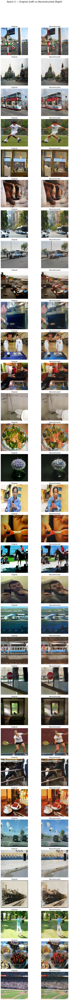

In [10]:
# Fetch validation batch
train_iter = iter(train_ds) # For plotting
x_train_batch, _ = next(train_iter)
x_train_rec, commitment_loss, codebook_loss, _ = model(x_train_batch, training=False)

# Number of image pairs to show
n = min(32, x_val_batch.shape[0])

# Set LARGE figsize: width=2 images * 6 inches, height=n rows * 4 inches
fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(12, n * 4))

for i in range(n):
    # Left: Original
    axes[i, 0].imshow(x_train_batch[i])
    axes[i, 0].set_title("Original", fontsize=14)
    axes[i, 0].axis("off")

    # Right: Reconstructed
    axes[i, 1].imshow(x_train_rec[i])
    axes[i, 1].set_title("Reconstructed", fontsize=14)
    axes[i, 1].axis("off")

plt.suptitle(f"Epoch {epoch} — Original (Left) vs Reconstructed (Right)", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [11]:
import pandas as pd
import seaborn as sns
from scipy.spatial.distance import pdist

# --- 1. Data Gathering: Get indices for BOTH codebooks ---
# This part iterates through the validation set once to be efficient.

print("Gathering codebook usage indices from the validation set...")

# Extract the codebook weights from the trained model
codebook1 = model.emb1.weights[0].numpy()
codebook2 = model.emb2.weights[0].numpy()
num_embeddings, d_head = codebook1.shape

# Lists to store the indices used by each codebook
all_indices_1 = []
all_indices_2 = []

# Loop over the validation dataset
for x_batch, _ in val_ds:
    # Get the latent representation from the encoder
    z = model.encoder(x_batch, training=False)
    
    # Split the latent space just like in the model's call method
    z1, z2 = tf.split(z, 2, axis=-1)
    z1_flat = tf.reshape(z1, [-1, d_head])
    z2_flat = tf.reshape(z2, [-1, d_head])
    
    # Quantize for codebook 1
    dist1 = (tf.reduce_sum(z1_flat**2, 1, keepdims=True) - 
             2 * tf.matmul(z1_flat, codebook1, transpose_b=True) + 
             tf.reduce_sum(codebook1**2, 1))
    k1 = tf.argmin(dist1, axis=1)
    all_indices_1.append(k1.numpy())
    
    # Quantize for codebook 2
    dist2 = (tf.reduce_sum(z2_flat**2, 1, keepdims=True) - 
             2 * tf.matmul(z2_flat, codebook2, transpose_b=True) + 
             tf.reduce_sum(codebook2**2, 1))
    k2 = tf.argmin(dist2, axis=1)
    all_indices_2.append(k2.numpy())

# Concatenate all batch results into single arrays
all_indices_1 = np.concatenate(all_indices_1)
all_indices_2 = np.concatenate(all_indices_2)

print("Finished gathering indices.\n")

Gathering codebook usage indices from the validation set...
Finished gathering indices.



--- Analysis for Codebook 1 ---
Codebook Usage: 94.24% (965 / 1024 vectors used)
Codebook Perplexity: 609.27 (a measure of how many codes are used on average)
Mean Inter-Code Vector Distance: 52.72


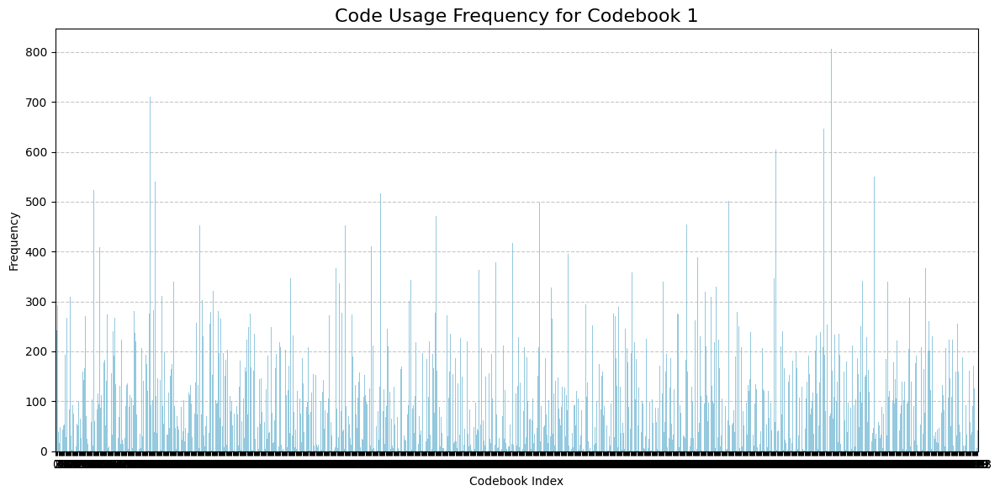



--- Analysis for Codebook 2 ---
Codebook Usage: 93.16% (954 / 1024 vectors used)
Codebook Perplexity: 527.30 (a measure of how many codes are used on average)
Mean Inter-Code Vector Distance: 54.14


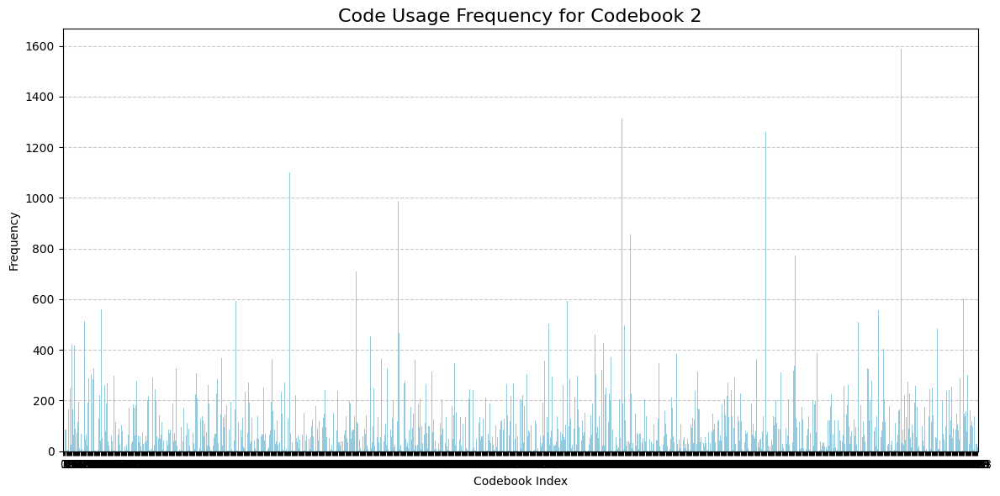

In [12]:
# --- 2. Helper Function for Analysis and Plotting ---
# This function encapsulates all the metrics and plotting logic.

def analyze_and_plot_codebook(codebook, indices, codebook_name: str):
    """
    Calculates and prints key metrics for a given codebook and its usage indices,
    and generates a frequency plot.
    
    Args:
        codebook (np.ndarray): The codebook embedding matrix.
        indices (np.ndarray): A flat array of all used codebook indices.
        codebook_name (str): The name for titles and print statements (e.g., "Codebook 1").
    """
    print(f"--- Analysis for {codebook_name} ---")
    
    num_embeddings = codebook.shape[0]
    unique_indices, counts = np.unique(indices, return_counts=True)
    
    # a) Codebook Usage
    num_used_vectors = len(unique_indices)
    usage_percentage = (num_used_vectors / num_embeddings) * 100
    print(f"Codebook Usage: {usage_percentage:.2f}% ({num_used_vectors} / {num_embeddings} vectors used)")

    # b) Perplexity
    probabilities = counts / len(indices)
    entropy = -np.sum(probabilities * np.log2(probabilities + 1e-12)) # Add epsilon for stability
    perplexity = 2**entropy
    print(f"Codebook Perplexity: {perplexity:.2f} (a measure of how many codes are used on average)")

    # c) Mean Inter-Vector Distance
    # This can be slow for very large codebooks, but is fine for K=1024
    if num_embeddings < 4096:
        distances = pdist(codebook, metric='euclidean')
        mean_distance = np.mean(distances)
        print(f"Mean Inter-Code Vector Distance: {mean_distance:.2f}")
    else:
        print("Skipping inter-vector distance calculation for large codebook to save time.")
        
    # d) Frequency Plot
    value_counts = pd.Series(indices).value_counts().sort_index()
    
    plt.figure(figsize=(12, 6))
    sns.barplot(x=value_counts.index, y=value_counts.values, color='skyblue')
    plt.title(f"Code Usage Frequency for {codebook_name}", fontsize=16)
    plt.xlabel("Codebook Index")
    plt.ylabel("Frequency")
    # Only show x-ticks if they are not too crowded
    if num_embeddings <= 64:
        plt.xticks(rotation=0)
    else:
        # For larger codebooks, let matplotlib decide the ticks
        pass 
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


# --- 3. Run Analysis for Each Codebook ---
# Now, simply call the helper function for each codebook.

analyze_and_plot_codebook(codebook1, all_indices_1, "Codebook 1")
print("\n" + "="*50 + "\n")
analyze_and_plot_codebook(codebook2, all_indices_2, "Codebook 2")